<center> <h1> <b>BIRDSONGS<b></h1> </center>
<center> <h1>Syllable Tutorial</h1> </center>

# Define Objects

Import package and define matplotlib backend

In [1]:
# the following line enable interact with figures, 
# you can make zoom and save images from a poup matplotlib window
# to select points: qt ipympl tk. To just visualize: notebook
%matplotlib ipympl

import birdsongs as bs
from birdsongs.utils import *

Define directories path and show audio files

In [16]:
# root_path   = "path_to_repository\\'
# audios_path = "audios_path\\'
# bird_name   = "Zonotrichia capensis"
# audios_path = "C:\\Users\\sebas\\Documents\\GitHub\\audios\\Dissertation-xeno\\"
audios_path = "C:\\Users\\sebas\\Documents\\GitHub\\audios\\Dissertation-xeno\\"

paths  = bs.Paths(audios_path=audios_path)              # root_path, audios_path, bird_name
ploter = bs.Ploter(save=True)   # to save figures save=True 
paths.ShowFiles()

The folder has 48 songs:
0-XC354142 - Pacific Antwren - Myrmotherula pacifica.wav
1-XC560180 - Northern White-fringed Antwren - Formicivora intermedia.wav
2-XC533991 - Northern White-fringed Antwren - Formicivora intermedia.wav
3-XC571692 - Barred Antshrike - Thamnophilus doliatus.wav
4-XC425528 - Black-crowned Antshrike - Thamnophilus atrinucha.wav
5-XC354141 - Black-crowned Antshrike - Thamnophilus atrinucha.wav
6-XC428484 - Ocellated Tapaculo - Acropternis orthonyx.wav
7-XC104508 - Ocellated Tapaculo - Acropternis orthonyx.wav
8-XC528035 - Tatama Tapaculo - Scytalopus alvarezlopezi.wav
9-XC562856 - Blackish Tapaculo - Scytalopus latrans.wav
10-XC693679 - Tropical Mockingbird - Mimus gilvus.wav
11-XC583075 - Tropical Mockingbird - Mimus gilvus.wav
12-XC244886 - Tropical Mockingbird - Mimus gilvus.wav
13-XC214346 - Tropical Mockingbird - Mimus gilvus.wav
14-XC127619 - Tropical Mockingbird - Mimus gilvus.wav
15-XC320365 - Tropical Mockingbird - Mimus gilvus.wav
16-XC17921 - Tropical Mo

Define, visualize and hear birdsong. The same funcion allow to us select the time of interest enabling SelectTime_on option

The son has 68 syllables


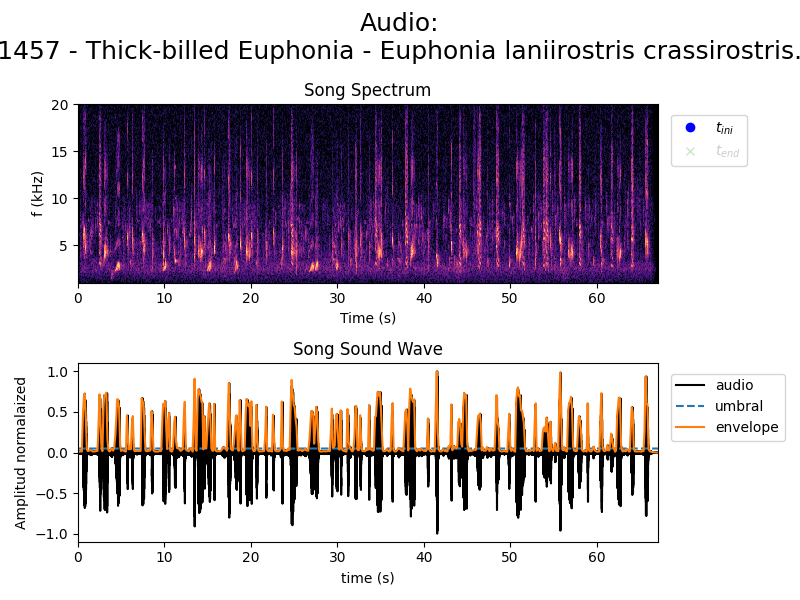

In [4]:
# no_file = int(input("Enter the number of song (1 to {0}): ".format(paths.no_files)))
birdsong = bs.BirdSong(paths, no_file=19, NN=512, flim=(1e3,20e3),
                       Nt=5000, umbral=0.05, split_method="amplitud")
ploter.Plot(birdsong, FF_on=False, SelectTime_on=True)
AudioPlay(birdsong)

Select time inverval of interest

In [5]:
time_interval = Positions(ploter.klicker)[0]
# time_interval = np.array([0.26681138, 0.70225052])
print("Time interval selected: initial time {:.4f} s, final time {:.4f} s".format(time_interval[0], time_interval[1]))

Time interval selected: initial time 4.2684 s, final time 4.9127 s


Define syllable by the previous time interval selected

In [ ]:
# %%time
# syllable = bs.Syllable(birdsong, tlim=time_interval, umbral_FF=1.45, Nt=30, NN=birdsong.NN)
# ploter.Plot(syllable, SelectTime_on=True, FF_on=True)
# AudioPlay(syllable)

In [ ]:
# time_interval = Positions(ploter.klicker)[0]
# print("Time interval selected: initial time {:.4f} s, final time {:.4f} s".format(time_interval[0], time_interval[1]))

3D plot (in process)

In [ ]:
# ploter.Plot3d(birdsong)

C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)


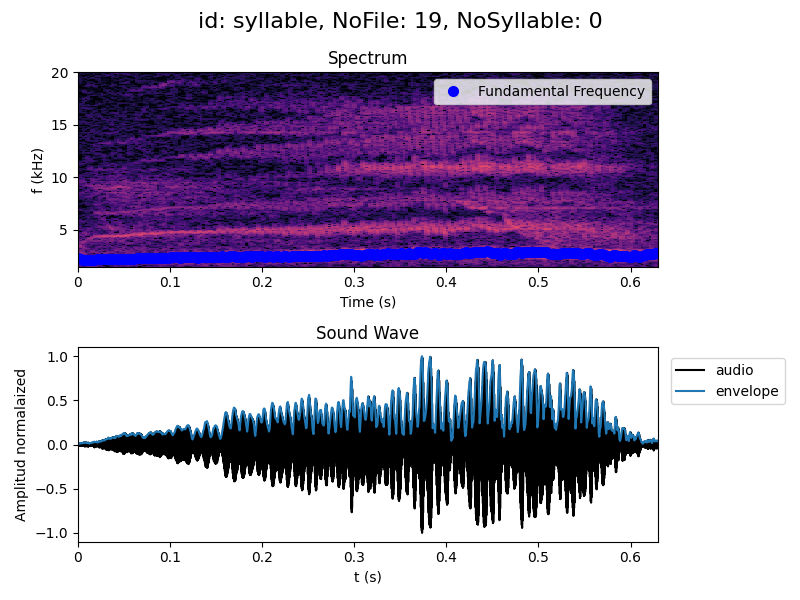

In [17]:
syllable = bs.Syllable(birdsong, tlim=time_interval, umbral_FF=0.8, NN=birdsong.NN, Nt=30, ide="syllable")

birdsong.syllable = syllable
birdsong.no_syllable= 1
# ploter.Plot(birdsong, FF_on=False, SelectTime_on=False, syllable_on=True)
ploter.Plot(syllable, FF_on=True)
AudioPlay(syllable)

Define syllable with the default syllable extractor

In [ ]:
# no_syllable    = int(input("Enter the syllable number (1 to {0}): ".format(bird.no_syllables)))
# syllable       = birdsong.Syllable(no_syllable=3)
# ploter.Plot(syllable)
# AudioPlay(syllable)

In [ ]:
# ploter.Plot(birdsong, FF_on=False, syllable_on=True, chunck_on=False)

# Optimal Synthetic Syllable

Define optimization method and its parameters 

In [8]:
brute     = {'method':'brute', 'Ns':11}  # , "workers":-1
optimizer = bs.Optimizer(syllable, method_kwargs=brute)
#?lmfit.minimize

Find optimal $\gamma$ for all the syllables computed by the syllables extractor. You can also just find the optimal for the single syllable

In [9]:
# optimal_gamma = optimizer.OptimalGamma(syllable)
optimal_gamma = 37000#optimizer.AllGammas(birdsong)

In [10]:
syllable.p["gm"].set(value=optimal_gamma)
syllable.p

name,value,initial value,min,max,vary
a0,0.11000000,0.11,0.01000000,0.25000000,False
a1,0.05000000,0.05,-2.00000000,2.00000000,False
a2,0.00000000,0.0,0.00000000,2.00000000,False
b0,-0.10000000,-0.1,-1.00000000,0.50000000,False
b1,1.00000000,1,0.00000000,2.00000000,False
b2,0.00000000,0.0,0.00000000,2.00000000,False
gm,37000.0000,40000.0,10000.0000,100000.000,False


Optimal $\alpha$ and $\beta$

In [11]:
optimizer.OptimalParams(syllable, Ns=11)

As


C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try incre

$a_0*$=0.1540, t=5.7730 min


C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try incre

$a_1*$=0.0000, t=5.9004 min
Bs


C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try incre

$b_0*$=-0.2500,
b_2*=1.8000, t=59.8939 min


C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)
C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try incre

$b_1*$=1.0000, t=6.4637 min
end
Time of execution = 78.0310 minutes


C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)


Display optimal parameters and generate a synthetic syllable 

In [12]:
Display(syllable.p)
synth_syllable = syllable.Solve(syllable.p)

name,value,initial value,min,max,vary
a0,0.15400000,0.11,0.01000000,0.25000000,False
a1,0.00000000,0.05,-2.00000000,2.00000000,False
a2,0.00000000,0.0,0.00000000,2.00000000,False
b0,-0.25000000,-0.1,-1.00000000,0.50000000,False
b1,1.00000000,1,0.00000000,2.00000000,False
b2,1.80000000,0.0,0.00000000,2.00000000,False
gm,37000.0000,40000.0,10000.0000,100000.000,False


C:\Users\sebas\anaconda3\lib\site-packages\librosa\util\decorators.py:88: UserWarning: Empty filters detected in mel frequency basis. Some channels will produce empty responses. Try increasing your sampling rate (and fmax) or reducing n_mels.
  return f(*args, **kwargs)


Visualize and plot the synthetic syllable

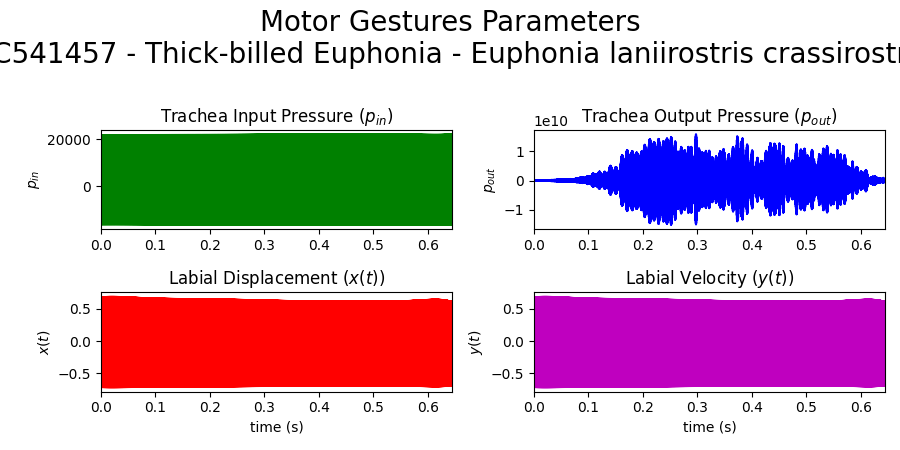

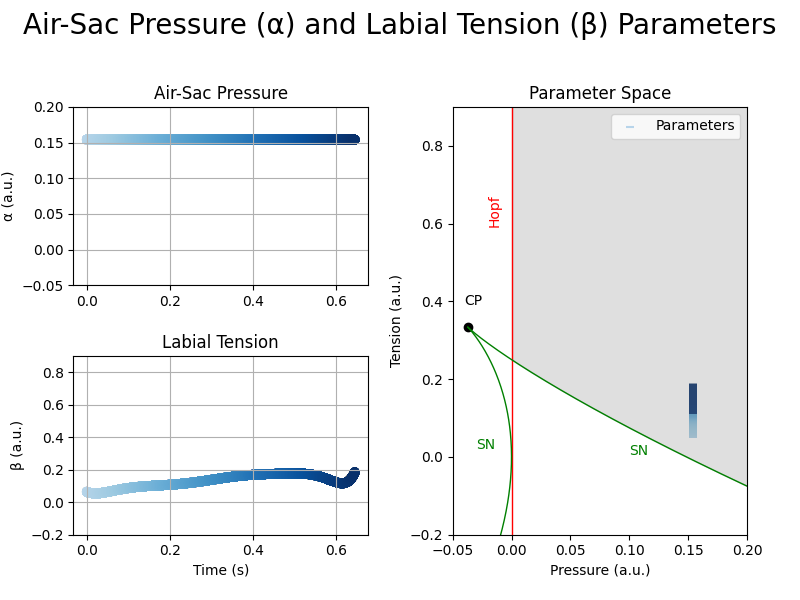

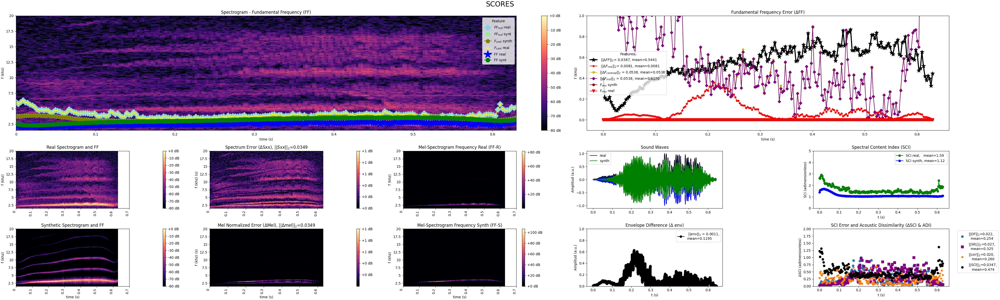

In [18]:
ploter.PlotVs(synth_syllable)
ploter.PlotAlphaBeta(synth_syllable)

ploter.Result(syllable, synth_syllable)
# ploter.Syllables(syllable, synth_syllable)
AudioPlay(synth_syllable)

In [14]:
AudioPlay(syllable)

Write synthetic and real syllables

In [19]:
syllable.WriteAudio(); synth_syllable.WriteAudio(); 

C:\Users\sebas\anaconda3\lib\site-packages\maad\sound\input_output.py:390: UserWarning: Values for bit depth should be 8, 16 or 32. Argument ignored.
  warn('Values for bit depth should be 8, 16 or 32. Argument ignored.')
